In [1]:
import os, sys
import gitpath
HOME_PATH = gitpath.root()
sys.path.append(HOME_PATH)

import pickle

import numpy as np

# Import pytorch dependencies
import torch
from torch.utils.data import DataLoader

# Import toolkits
from utils.visualization_3D_objects import *

from nn.pointnetae import *
from nn.gf_vae import *

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


In [2]:
DATASET = 'shapenet'
CATEGORY = 'car'
DATA_PATH = os.path.join(HOME_PATH, "data/preprocessed", DATASET, CATEGORY)
CHECKPOINT_FOLDER = os.path.join(HOME_PATH, "saved_nn")
# MODEL_TYPE = "global_feat_VAE_beta100_car"
MODEL_TYPE = "global_feat_VAE_car"
POINTNET_NAME = "PointNetAE_car"

### Import Preprocessed ModelNet40 cars (Run shapenet_preprocessing.ipynb first to get these data)

In [14]:
BATCH_SIZE = 16
global_feat = np.loadtxt("global_feat.csv", delimiter=",", dtype=float)
data_loader = DataLoader(
    global_feat, 
    batch_size=BATCH_SIZE, 
    shuffle=False, 
    num_workers=4,
    drop_last=True
)

print(global_feat.shape)

(1824, 1024)


### Load saved model

In [4]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
if device =='cuda':
    print("Run on GPU...")
else:
    print("Run on CPU...")
    
model_test = VAE()
state_dict = torch.load(os.path.join(CHECKPOINT_FOLDER, MODEL_TYPE + '.pth')) # change the path to your own checkpoint file
model_test.cuda()
model_test.load_state_dict(state_dict['state_dict'])
model_test.eval()

print(state_dict['epoch'])

Run on GPU...
340


In [5]:
pointnetae = PointNet_AE(3, 2048)
state_dict = torch.load(os.path.join(CHECKPOINT_FOLDER, POINTNET_NAME + '.pth')) # change the path to your own checkpoint file
pointnetae.cuda()
pointnetae.load_state_dict(state_dict['state_dict'])
pointnetae.eval()

print(state_dict['epoch'])

184


In [15]:
x = data_loader.__iter__().next() # hack to grab a batch

inputs = x.float().to(device)

outputs, global_feat_x = model_test(inputs)

X = pointnetae.decoder(inputs).cpu().detach().numpy()[12]
X_hat = pointnetae.decoder(outputs).cpu().detach().numpy()[12]

fig1 = draw3DPoints(X, title = "Original Car", show = True)
fig2 = draw3DPoints(X_hat, title = "Reconstructed Car", show = True)

In [7]:
X_sample = pointnetae.decoder(model_test.decoder(torch.randn(12, 128).cuda())).cpu().detach().numpy()
fig = draw3DPoints(X_sample[0], title = "Sampled " + CATEGORY)
fig.show()

In [8]:
def extractGlobalFeatForAllData(data_loader, model_test, device):
    latent_vectors_lst = []
    for batch_idx, (inputs) in enumerate(data_loader):
        # copy inputs to device
        inputs = inputs.float().to(device)
        # compute the output and loss
        outputs, latent_vectors_i = model_test(inputs)
        latent_vectors_lst.append(latent_vectors_i.cpu().detach().numpy())
        
    latent_vectors = np.vstack(latent_vectors_lst)
    return latent_vectors

latent_vectors = extractGlobalFeatForAllData(data_loader, model_test, device)
print(np.mean(np.mean(latent_vectors)), np.mean(np.var(latent_vectors)))

0.002865071 1.0090426


In [9]:
idx = 17
feature = torch.from_numpy(latent_vectors[idx]).cuda()
feature = feature.view(1, *feature.size())
draw3DPoints(pointnetae.decoder(model_test.decoder(feature)).cpu().detach().numpy()[0])

In [17]:
def vae_interpolate_shape(model_test, pointnetae, global_feat, idx1, idx2, n=20):
    z_1 = global_feat[idx1]
    z_2 = global_feat[idx2]
    
    z_np = np.stack([z_1 + (z_2 - z_1)*t for t in np.linspace(0, 1, n)])
    z = torch.from_numpy(z_np).float().cuda()
    
    interpolate_list = pointnetae.decoder(model_test.decoder(z)).view(n, 1, 3, 2048)
    interpolate_list = interpolate_list.to('cpu').detach().numpy()
    return z_np, interpolate_list

def ae_interpolate_shape(pointnetae, global_feat, idx1, idx2, n=20):
    z_1 = global_feat[idx1]
    z_2 = global_feat[idx2]
    
    z_np = np.stack([z_1 + (z_2 - z_1)*t for t in np.linspace(0, 1, n)])
    z = torch.from_numpy(z_np).float().cuda()
    
    interpolate_list = pointnetae.decoder(z).view(n, 1, 3, 2048)
    interpolate_list = interpolate_list.to('cpu').detach().numpy()
    return z_np, interpolate_list

In [18]:
z_np_vae, vae_interpolate_list = vae_interpolate_shape(model_test, pointnetae, latent_vectors, 12, 17, n=10)
z_np_ae, ae_interpolate_list = ae_interpolate_shape(pointnetae, global_feat, 12, 17, n=10)

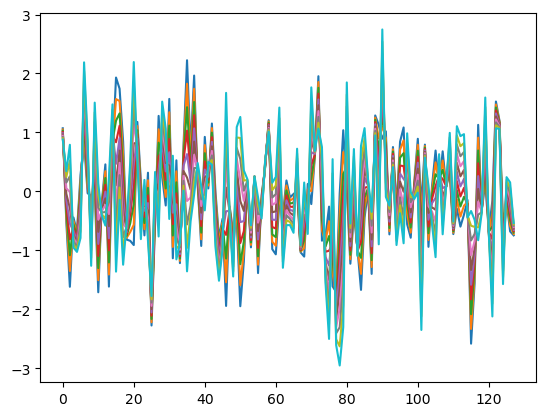

In [12]:
for i in range(z_np.shape[0]):
    plt.plot(z_np[i])

plt.show()

In [13]:
# from matplotlib.widgets import Slider

# fig = plt.figure()
# plt.subplots_adjust(bottom=0.25)
# ax = fig.subplots()
# p = ax.plot(range(z_np.shape[1]),z_np[0])

# ax_slide = plt.axes([0.25, 0.1, 0.65, 0.03])
# # Properties of the slider
# s_factor = Slider(ax_slide, 'Timestamp', 0, z_np.shape[0], valinit=0, valstep=1)

# def update(val):
#     p.set_ydata(z_np[(int)(val)])
#     #redrawing the figure
#     fig.canvas.draw()

# s_factor.on_changed(update)
# plt.show()

In [19]:
fig = draw3DpointsSlider(vae_interpolate_list, 0, 0)

In [20]:
fig = draw3DpointsSlider(ae_interpolate_list, 0, 0)

In [15]:
# for i, X in enumerate(interpolate_list):
#     fig1 = draw3DPoints(X[0], point_size = 5, show = False)
#     save3DPointsImage(fig1, save_path = os.path.join(HOME_PATH, "images"), title = "interpolation_%d"%i)

In [21]:
def save_plt_interpolation(interpolate_list,title):
    fig = plt.figure(figsize=(30,6))

    # Plot the data
    for i in range(10):
        X = interpolate_list[i][0]
        x, y, z = X[0], X[1], X[2]
        ax1 = fig.add_subplot(2, 10, i + 1, projection='3d')
        ax1.scatter(x, y, z, s = 1)
        ax1.view_init(-90, 90)

        l_bound = np.min(x)+1; u_bound = np.max(x)-1
        # l_bound = -5; u_bound = 5
        ax1.set_xlim(l_bound, u_bound)
        ax1.set_ylim(l_bound, u_bound)
        ax1.set_zlim(l_bound, u_bound)
        ax1.axis('off')

        ax2 = fig.add_subplot(2, 10, 10 + i + 1, projection='3d')
        ax2.scatter(x, y, z, s = 1)
        ax2.view_init(0, 90)

        l_bound = np.min(x)+1; u_bound = np.max(x)-1
        # l_bound = -5; u_bound = 5
        ax2.set_xlim(l_bound, u_bound)
        ax2.set_ylim(l_bound, u_bound)
        ax2.set_zlim(l_bound, u_bound)
        ax2.axis('off')

    plt.show()
    plt.savefig(os.path.join(HOME_PATH, "images", title + ".png"))

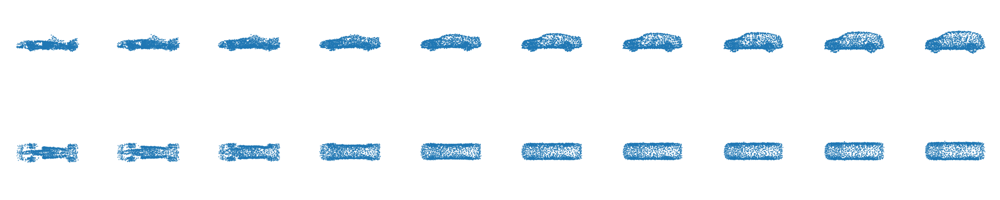

<Figure size 640x480 with 0 Axes>

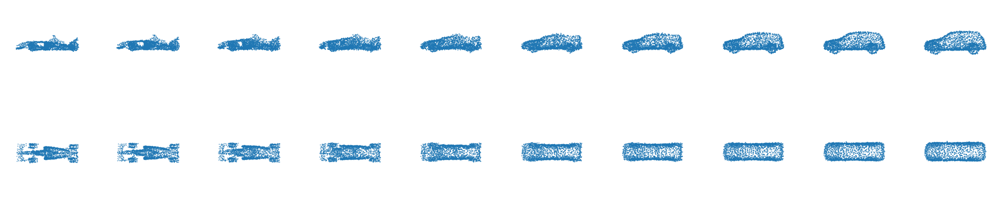

<Figure size 640x480 with 0 Axes>

In [22]:
save_plt_interpolation(vae_interpolate_list,"vae_interpolation")
save_plt_interpolation(ae_interpolate_list,"ae_interpolation")